# Capstone Project - The Battle of the Neighborhoods (Week 2)
Applied Data Science Capstone by IBM/Coursera

## Introduction: Business Problem 
In this project we will try to find out if a company managing succesfull wine bar in Milan can expand activity in Toronto Canada.

We'll try to find similarity between Toronto and Milan and afterwards the neighborhodds in Toronto that are similar to the neighborhoods in Milan where is located the Wine bar. 

We would also prefer locations as close to city center as possible, where Wine Bar are not present.

We will use our data science powers to generate a few most promissing neighborhoods based on this criteria. Advantages of each area will then be clearly expressed so that best possible final location can be chosen by stakeholders.

## Data 
Based on definition of our problem, factors that will influence our decission are:

- similarity of neighborhoods of Toronto and Milan, neighborhoods belonging to the same cluster
- similarity of the neighborhoods of Milan where the wind bar is located and neighborhoods of Toronto
- Number of Wine bar in the target neigborhoods
- distance of the target neighoborhoos from the center

Following data sources will be needed to extract/generate the required information:

- Postal code of Milan and Toronto
- latitude & longitude of Milan and Toronto city center using Google Maps geocoding API.
- Coordinates of the extracted Postal Code
- Venues in each neighborhoods to segment and classify, venues will be obtained using Foursquare API



##Before we get the data and start exploring it, let's download all the dependencies that we will need.

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
from bs4 import BeautifulSoup
import requests

print('Libraries imported.')

Libraries imported.


<a id='item1'></a>

## Download and Explore  Toronto Dataset
scraping the url to extract the table text

In [2]:
url = 'https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M'
source = requests.get(url).text

soup = BeautifulSoup(source, 'lxml')
table=soup.find('table')
TB=table.tbody.text
TB

"\nPostcode\nBorough\nNeighbourhood\n\n\nM1A\nNot assigned\nNot assigned\n\n\nM2A\nNot assigned\nNot assigned\n\n\nM3A\nNorth York\nParkwoods\n\n\nM4A\nNorth York\nVictoria Village\n\n\nM5A\nDowntown Toronto\nHarbourfront\n\n\nM5A\nDowntown Toronto\nRegent Park\n\n\nM6A\nNorth York\nLawrence Heights\n\n\nM6A\nNorth York\nLawrence Manor\n\n\nM7A\nQueen's Park\nNot assigned\n\n\nM8A\nNot assigned\nNot assigned\n\n\nM9A\nEtobicoke\nIslington Avenue\n\n\nM1B\nScarborough\nRouge\n\n\nM1B\nScarborough\nMalvern\n\n\nM2B\nNot assigned\nNot assigned\n\n\nM3B\nNorth York\nDon Mills North\n\n\nM4B\nEast York\nWoodbine Gardens\n\n\nM4B\nEast York\nParkview Hill\n\n\nM5B\nDowntown Toronto\nRyerson\n\n\nM5B\nDowntown Toronto\nGarden District\n\n\nM6B\nNorth York\nGlencairn\n\n\nM7B\nNot assigned\nNot assigned\n\n\nM8B\nNot assigned\nNot assigned\n\n\nM9B\nEtobicoke\nCloverdale\n\n\nM9B\nEtobicoke\nIslington\n\n\nM9B\nEtobicoke\nMartin Grove\n\n\nM9B\nEtobicoke\nPrincess Gardens\n\n\nM9B\nEtobicoke\n

In [3]:
type(TB)

str

Now let's generate an array from the table text

In [51]:
TB1=TB.split('\n')
while("" in TB1) : 
    TB1.remove("") 
TB1
TB1=TB1[3:]
#TB1

In [52]:
len(TB1)

864

A data frame will be generated with 3 columns and 288 rows

In [53]:
df1 = np.array(TB1).reshape(288,3)
df=pd.DataFrame(df1,columns=['PostalCode','Borough','Neighborhood'])
df.head()

,PostalCode,Borough,Neighborhood
0,M1A,Not assigned,Not assigned
1,M2A,Not assigned,Not assigned
2,M3A,North York,Parkwoods
3,M4A,North York,Victoria Village
4,M5A,Downtown Toronto,Harbourfront


'Not assigned' value for the Borough columns will be canceled, 'Not assigned' value for 'Neighborhood will be replaced with the value of 'Borough'

In [54]:
df.drop(df[df.Borough =='Not assigned'].index, inplace=True)
#df

In [55]:
df.Neighborhood[df.Neighborhood=='Not assigned'] = df.Borough
df = df.reset_index(drop=True)
#df
    

Postal code will be grouped joining all Neighborhood

In [56]:
df_g=df.groupby(['PostalCode','Borough'],as_index=False).agg(lambda x : x.sum() if x.dtype=='float64' else ', '.join(x))
#df_g

In [57]:
df_g.shape

(103, 3)


Geocoordinates of single postal code is obtained by a csv file downloaded from the web

In [58]:
Coor = pd.read_csv("Geospatial_Coordinates.csv")
Coor.head()

,Postal Code,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [59]:
Coor.rename(columns={'Postal Code': 'PostalCode'}, inplace=True)
Coor.head()

,PostalCode,Latitude,Longitude
0,M1B,43.806686,-79.194353
1,M1C,43.784535,-79.160497
2,M1E,43.763573,-79.188711
3,M1G,43.770992,-79.216917
4,M1H,43.773136,-79.239476


In [60]:
Toronto_data = pd.merge(df_g, Coor, on='PostalCode', how='inner')
Toronto_data.head()


,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Rouge, Malvern",43.806686,-79.194353
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.784535,-79.160497
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711
3,M1G,Scarborough,Woburn,43.770992,-79.216917
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476


In [61]:
print(Toronto_data.dtypes)

PostalCode       object
Borough          object
Neighborhood     object
Latitude        float64
Longitude       float64
dtype: object


In [62]:
Toronto_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 103 entries, 0 to 102
Data columns (total 5 columns):
PostalCode      103 non-null object
Borough         103 non-null object
Neighborhood    103 non-null object
Latitude        103 non-null float64
Longitude       103 non-null float64
dtypes: float64(2), object(3)
memory usage: 4.8+ KB


Coordinates of Toronto is obtained through the geolocator API

In [63]:
address = 'Toronto'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Toronto are 43.653963, -79.387207.


In [64]:
Toronto_data.head()

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Rouge, Malvern",43.806686,-79.194353
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.784535,-79.160497
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711
3,M1G,Scarborough,Woburn,43.770992,-79.216917
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476


In [65]:
Toronto_data

,PostalCode,Borough,Neighborhood,Latitude,Longitude
0,M1B,Scarborough,"Rouge, Malvern",43.806686,-79.194353
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.784535,-79.160497
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711
3,M1G,Scarborough,Woburn,43.770992,-79.216917
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476
5,M1J,Scarborough,Scarborough Village,43.744734,-79.239476
6,M1K,Scarborough,"East Birchmount Park, Ionview, Kennedy Park",43.727929,-79.262029
7,M1L,Scarborough,"Clairlea, Golden Mile, Oakridge",43.711112,-79.284577
8,M1M,Scarborough,"Cliffcrest, Cliffside, Scarborough Village West",43.716316,-79.239476
9,M1N,Scarborough,"Birch Cliff, Cliffside West",43.692657,-79.264848


### Insert a column whith di distance of the Borough from the center of the city

In [66]:
import geopy.distance

coords_1 = (latitude, longitude)
coords_2 = (Toronto_data.iloc[0]['Latitude'],Toronto_data.iloc[0]['Longitude'])

print(geopy.distance.geodesic(coords_1, coords_2).km)

23.007850971730743


In [67]:
for i in range(0,len(Toronto_data)):
    distance = geopy.distance.geodesic(coords_1, (Toronto_data.iloc[i]['Latitude'],Toronto_data.iloc[i]['Longitude'])).km
    
    Toronto_data.loc[i,'distance_TC']=distance

In [68]:
Toronto_data

,PostalCode,Borough,Neighborhood,Latitude,Longitude,distance_TC
0,M1B,Scarborough,"Rouge, Malvern",43.806686,-79.194353,23.007851
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.784535,-79.160497,23.328604
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711,20.106100
3,M1G,Scarborough,Woburn,43.770992,-79.216917,18.905558
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476,17.806443
5,M1J,Scarborough,Scarborough Village,43.744734,-79.239476,15.605355
6,M1K,Scarborough,"East Birchmount Park, Ionview, Kennedy Park",43.727929,-79.262029,13.014814
7,M1L,Scarborough,"Clairlea, Golden Mile, Oakridge",43.711112,-79.284577,10.430614
8,M1M,Scarborough,"Cliffcrest, Cliffside, Scarborough Village West",43.716316,-79.239476,13.779553
9,M1N,Scarborough,"Birch Cliff, Cliffside West",43.692657,-79.264848,10.763485


## Create a Map of Toronto with a Circle indicating each Neighborhood

In [69]:
# create map of Toronto using latitude and longitude values
map_Toronto = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(Toronto_data['Latitude'], Toronto_data['Longitude'], Toronto_data['PostalCode']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Toronto)  
    
map_Toronto

## Download and Explore Milan Dataset¶
Scraping the web to obtain the postal Code of Milan

In [70]:
url = 'https://worldpostalcode.com/italy/lombardia/milano'
source = requests.get(url).text

soupM = BeautifulSoup(source, 'lxml')
print(soupM)

<!DOCTYPE HTML>
<html lang="en">
<head>
<title>Milano, Italy Postal Codes</title>
<meta content="Postal codes for Milano, Italy. Use our interactive map, address lookup, or code list to find the correct zip code for your postal mails destination." name="Description"/>
<meta content="width=device-width, initial-scale=1" name="viewport"/>
<meta content="text/html; charset=utf-8" http-equiv="Content-Type"/>
<script>
        !function(e){"use strict";var n=function(n,t,o){function i(e){return a.body?e():void setTimeout(function(){i(e)})}function r(){l.addEventListener&&l.removeEventListener("load",r),l.media=o||"all"}var d,a=e.document,l=a.createElement("link");if(t)d=t;else{var s=(a.body||a.getElementsByTagName("head")[0]).childNodes;d=s[s.length-1]}var f=a.styleSheets;l.rel="stylesheet",l.href=n,l.media="only x",i(function(){d.parentNode.insertBefore(l,t?d:d.nextSibling)});var u=function(e){for(var n=l.href,t=f.length;t--;)if(f[t].href===n)return e();setTimeout(function(){u(e)})};return 

In [71]:
postal_code=[] # initialize an empty dictionary to save the data in

for place in soupM.find_all('span'):
        postal_code.append({'PostalCode':place.text})
            
                      
ZIPCode=pd.DataFrame(postal_code)
ZIPCode.head()

,PostalCode
0,Postal Code
1,Italy
2,Lombardia
3,Milano
4,Milano


Extract only the postal code from Milan

In [72]:
ZIPCode_M=ZIPCode.loc[(ZIPCode.index > 127) & (ZIPCode.index < 166)]
ZIPCode_M.reset_index(drop=True)

,PostalCode
0,20121
1,20122
2,20123
3,20124
4,20125
5,20126
6,20127
7,20128
8,20129
9,20131


In [73]:
Milan_data=pd.DataFrame(columns=['PostalCode','Latitude','Longitude'])
Milan_data

,PostalCode,Latitude,Longitude


Coordinates of Toronto is obtained through the geolocator API

In [74]:
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="IT")
for i in range(0,len(ZIPCode_M)):
    location = geolocator.geocode(ZIPCode_M.iloc[i]['PostalCode'],'IT')
    #print(location.latitude, location.longitude)
    Latitude=location.latitude
    Longitude=location.longitude
    Milan_data.loc[i]=[ZIPCode_M.iloc[i]['PostalCode'],Latitude,Longitude]
    
Milan_data

,PostalCode,Latitude,Longitude
0,20121,45.472145,9.188064
1,20122,45.461893,9.196410
2,20123,45.461494,9.188516
3,20124,45.481316,9.198054
4,20125,45.495216,9.196247
5,20126,45.513278,9.217619
6,20127,45.496558,9.220432
7,20128,45.514930,9.225498
8,20129,45.471424,9.213826
9,20131,45.483765,9.222378


Looking at the data we observe that lines 10,15,19,23,27 are wrong data and will be cancelled

In [75]:
Milan_data.drop([10,15,19,23,27], axis=0,inplace=True)
Milan_data.reset_index(inplace=True, drop=True) 
Milan_data

,PostalCode,Latitude,Longitude
0,20121,45.472145,9.188064
1,20122,45.461893,9.196410
2,20123,45.461494,9.188516
3,20124,45.481316,9.198054
4,20125,45.495216,9.196247
5,20126,45.513278,9.217619
6,20127,45.496558,9.220432
7,20128,45.514930,9.225498
8,20129,45.471424,9.213826
9,20131,45.483765,9.222378


In [76]:
address = 'Milano'

geolocator = Nominatim(user_agent="ny_explorer")
locationM = geolocator.geocode(address)
latitudeM = location.latitude
longitudeM = location.longitude
print('The geograpical coordinate of Milano are {}, {}.'.format(latitudeM, longitudeM))

The geograpical coordinate of Milano are 45.5129025857037, 9.19772809144639.


In [77]:
# create map of Milano using latitude and longitude values
map_Milan = folium.Map(location=[latitudeM, longitudeM], zoom_start=11)

# add markers to map
for latM, lngM, labelM in zip(Milan_data['Latitude'], Milan_data['Longitude'], Milan_data['PostalCode']):
    labelM = folium.Popup(labelM, parse_html=True)
    folium.CircleMarker(
        [latM, lngM],
        radius=5,
        popup=labelM,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Milan)  
    
map_Milan

# Merge of Milan and Toronto Data to cluster together

In [188]:
Milan_data['City'] = 'Milan'
Milan_data.head()

,PostalCode,Latitude,Longitude,City
0,20121,45.472145,9.188064,Milan
1,20122,45.461893,9.196410,Milan
2,20123,45.461494,9.188516,Milan
3,20124,45.481316,9.198054,Milan
4,20125,45.495216,9.196247,Milan


In [189]:
Toronto_data['City'] = 'Toronto'
Toronto_data.head()


,PostalCode,Borough,Neighborhood,Latitude,Longitude,distance_TC,City
0,M1B,Scarborough,"Rouge, Malvern",43.806686,-79.194353,23.007851,Toronto
1,M1C,Scarborough,"Highland Creek, Rouge Hill, Port Union",43.784535,-79.160497,23.328604,Toronto
2,M1E,Scarborough,"Guildwood, Morningside, West Hill",43.763573,-79.188711,20.106100,Toronto
3,M1G,Scarborough,Woburn,43.770992,-79.216917,18.905558,Toronto
4,M1H,Scarborough,Cedarbrae,43.773136,-79.239476,17.806443,Toronto


In [190]:
frames = [Toronto_data, Milan_data]

Tor_Mil_data = pd.concat(frames)
Tor_Mil_data.reset_index(drop=True, inplace=True)
Tor_Mil_data

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  This is separate from the ipykernel package so we can avoid doing imports until


,Borough,City,Latitude,Longitude,Neighborhood,PostalCode,distance_TC
0,Scarborough,Toronto,43.806686,-79.194353,"Rouge, Malvern",M1B,23.007851
1,Scarborough,Toronto,43.784535,-79.160497,"Highland Creek, Rouge Hill, Port Union",M1C,23.328604
2,Scarborough,Toronto,43.763573,-79.188711,"Guildwood, Morningside, West Hill",M1E,20.106100
3,Scarborough,Toronto,43.770992,-79.216917,Woburn,M1G,18.905558
4,Scarborough,Toronto,43.773136,-79.239476,Cedarbrae,M1H,17.806443
5,Scarborough,Toronto,43.744734,-79.239476,Scarborough Village,M1J,15.605355
6,Scarborough,Toronto,43.727929,-79.262029,"East Birchmount Park, Ionview, Kennedy Park",M1K,13.014814
7,Scarborough,Toronto,43.711112,-79.284577,"Clairlea, Golden Mile, Oakridge",M1L,10.430614
8,Scarborough,Toronto,43.716316,-79.239476,"Cliffcrest, Cliffside, Scarborough Village West",M1M,13.779553
9,Scarborough,Toronto,43.692657,-79.264848,"Birch Cliff, Cliffside West",M1N,10.763485


In [191]:
Tor_Mil_data.drop('distance_TC',axis=1,inplace=True)

In [192]:
Tor_Mil_data.head()

,Borough,City,Latitude,Longitude,Neighborhood,PostalCode
0,Scarborough,Toronto,43.806686,-79.194353,"Rouge, Malvern",M1B
1,Scarborough,Toronto,43.784535,-79.160497,"Highland Creek, Rouge Hill, Port Union",M1C
2,Scarborough,Toronto,43.763573,-79.188711,"Guildwood, Morningside, West Hill",M1E
3,Scarborough,Toronto,43.770992,-79.216917,Woburn,M1G
4,Scarborough,Toronto,43.773136,-79.239476,Cedarbrae,M1H



## Define Foursquare Credentials and Version

In [85]:
CLIENT_ID = 'BJQS0VP3DRRDMYFYE02JAMBD2Z45ECCVOBJLG4UARVCJEP13' # your Foursquare ID
CLIENT_SECRET = 'RKTURNLPNUWZEKBCU0LFLDEGAV2PESMA3ZOOFZRJWTVU231X' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: BJQS0VP3DRRDMYFYE02JAMBD2Z45ECCVOBJLG4UARVCJEP13
CLIENT_SECRET:RKTURNLPNUWZEKBCU0LFLDEGAV2PESMA3ZOOFZRJWTVU231X


## Explore Neighborhoods in Both Cities, Toronto and Milan, using Foursquare
Let's create a function to repeat the same process to all the neighborhoods

In [86]:
def getNearbyVenues(names, City, latitudes, longitudes, radius=500, LIMIT=100):
    
    venues_list=[]
    for name, City, lat, lng in zip(names, City, latitudes, longitudes):
        #print(name, City)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name,
            City,
            lat, 
            lng, 
            v['venue']['name'],
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['PostalCode',
                  'City',
                  'PostalCode Latitude', 
                  'PostalCode Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Now write the code to run the above function on each neighborhood and create a new dataframe called Tor_Mil_venues.

In [87]:
Tor_Mil_venues = getNearbyVenues(names=Tor_Mil_data['PostalCode'],City=Tor_Mil_data['City'],
                                   latitudes=Tor_Mil_data['Latitude'],
                                   longitudes=Tor_Mil_data['Longitude']
                                  )

In [89]:
print(Tor_Mil_venues.shape)
Tor_Mil_venues

(3454, 8)


,PostalCode,City,PostalCode Latitude,PostalCode Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,M1B,Toronto,43.806686,-79.194353,Wendy's,43.807448,-79.199056,Fast Food Restaurant
1,M1B,Toronto,43.806686,-79.194353,Interprovincial Group,43.805630,-79.200378,Print Shop
2,M1C,Toronto,43.784535,-79.160497,Chris Effects Painting,43.784343,-79.163742,Construction & Landscaping
3,M1C,Toronto,43.784535,-79.160497,Royal Canadian Legion,43.782533,-79.163085,Bar
4,M1E,Toronto,43.763573,-79.188711,Swiss Chalet Rotisserie & Grill,43.767697,-79.189914,Pizza Place
5,M1E,Toronto,43.763573,-79.188711,G & G Electronics,43.765309,-79.191537,Electronics Store
6,M1E,Toronto,43.763573,-79.188711,Marina Spa,43.766000,-79.191000,Spa
7,M1E,Toronto,43.763573,-79.188711,Big Bite Burrito,43.766299,-79.190720,Mexican Restaurant
8,M1E,Toronto,43.763573,-79.188711,chatr Mobile,43.765917,-79.191672,Tech Startup
9,M1E,Toronto,43.763573,-79.188711,Enterprise Rent-A-Car,43.764076,-79.193406,Rental Car Location


Let's check how many venues were returned for each neighborhood

In [90]:
Tor_Mil_venues.groupby('PostalCode').count()

,City,PostalCode Latitude,PostalCode Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
PostalCode,,,,,,,
20121,100,100,100,100,100,100,100
20122,99,99,99,99,99,99,99
20123,100,100,100,100,100,100,100
20124,77,77,77,77,77,77,77
20125,33,33,33,33,33,33,33
20126,18,18,18,18,18,18,18
20127,22,22,22,22,22,22,22
20128,22,22,22,22,22,22,22
20129,53,53,53,53,53,53,53


Let's find out how many unique categories can be curated from all the returned venues

In [91]:
print('There are {} uniques categories.'.format(len(Tor_Mil_venues['Venue Category'].unique())))

There are 330 uniques categories.


# Analyze Each Neighborhood¶

In [92]:
#Toronto_venues[['Venue Category']

In [93]:
Tor_Mil_onehot = pd.get_dummies(Tor_Mil_venues[['Venue Category']], prefix="", prefix_sep="")
Tor_Mil_onehot.head()


,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Store,Shopping Mall,

In [94]:
# one hot encoding
Tor_Mil_onehot = pd.get_dummies(Tor_Mil_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Tor_Mil_onehot['PostalCode'] = Tor_Mil_venues['PostalCode']
Tor_Mil_onehot['City'] = Tor_Mil_venues['City']
cols = list(Tor_Mil_onehot)

# move the column to head of list using index, pop and insert
cols.insert(0, cols.pop(cols.index('City')))
cols
# use ix to reorder
Tor_Mil_onehot = Tor_Mil_onehot.loc[:, cols]
# move the column to head of list using index, pop and insert
cols.insert(0, cols.pop(cols.index('PostalCode')))
cols
Tor_Mil_onehot = Tor_Mil_onehot.loc[:, cols]
Tor_Mil_onehot.head()

,PostalCode,City,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Stor

In [95]:
Tor_Mil_onehot.shape

(3454, 332)

In [96]:
Tor_Mil_onehot.loc[Tor_Mil_onehot['PostalCode']== 'M1B']

,PostalCode,City,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Stor

Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [97]:
Tor_Mil_grouped_sum = Tor_Mil_onehot.groupby('PostalCode').sum().reset_index()
Tor_Mil_grouped_sum.head()

,PostalCode,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Store,Sho

In [233]:
Tor_Mil_grouped_sum_winebar=Tor_Mil_grouped_sum[['PostalCode','Wine Bar']]
Tor_Mil_grouped_sum_winebar.head()

,PostalCode,Wine Bar
0,20121,3
1,20122,3
2,20123,1
3,20124,1
4,20125,0


In [99]:
Tor_Mil_grouped_sum_winebar_otherBar=Tor_Mil_grouped_sum[['PostalCode','Wine Bar','Wine Shop','Bar','Beer Bar','Café','Cocktail Bar', 'Coffee Shop']]
Tor_Mil_grouped_sum_winebar_otherBar['Total'] =Tor_Mil_grouped_sum_winebar_otherBar.sum(axis=1)
Tor_Mil_grouped_sum_winebar_otherBar

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,PostalCode,Wine Bar,Wine Shop,Bar,Beer Bar,Café,Cocktail Bar,Coffee Shop,Total
0,20121,3,0,0,0,4,2,1,10
1,20122,3,0,1,0,3,2,3,12
2,20123,1,0,1,0,8,3,2,15
3,20124,1,0,1,0,7,4,0,13
4,20125,0,0,0,0,2,0,0,2
5,20126,0,0,0,0,3,0,0,3
6,20127,0,0,0,0,1,1,0,2
7,20128,0,0,0,0,2,0,0,2
8,20129,0,1,1,0,3,2,1,8
9,20131,0,0,3,0,4,0,0,7


In [262]:
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt
#optional: check if Matplotlib is loaded.

print ('Matplotlib version: ', mpl.__version__) # >= 2.0.0
#optional: apply a style to Matplotlib.

Matplotlib version:  3.0.3


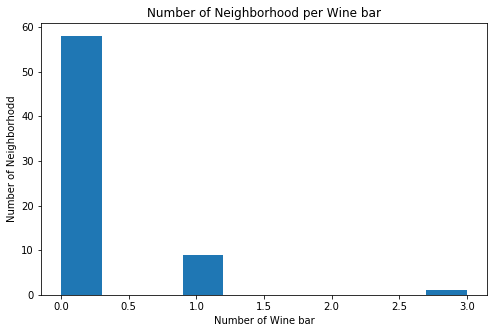

In [264]:
Tor_Mil_grouped_sum_winebar_otherBar['Wine Bar'].plot(kind='hist', figsize=(8, 5))

plt.title('Number of Neighborhood per Wine bar') # add a title to the histogram
plt.ylabel('Number of Neighborhodd') # add y-label
plt.xlabel('Number of Wine bar') # add x-label

plt.show()

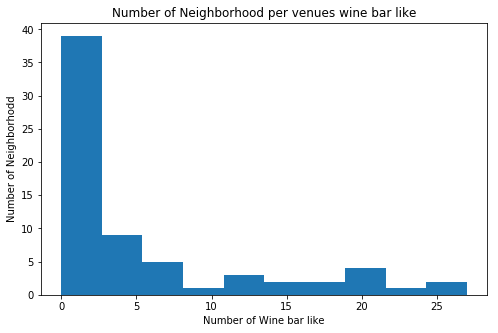

In [266]:
Tor_Mil_grouped_sum_winebar_otherBar['Total'].plot(kind='hist', figsize=(8, 5))

plt.title('Number of Neighborhood per venues wine bar like') # add a title to the histogram
plt.ylabel('Number of Neighborhodd') # add y-label
plt.xlabel('Number of Wine bar like') # add x-label

plt.show()

In [100]:
Tor_Mil_grouped = Tor_Mil_onehot.groupby('PostalCode').mean().reset_index()
Tor_Mil_grouped.head()

,PostalCode,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Store,Sho

In [101]:
Tor_Mil_grouped.shape

(133, 331)

Let's print each neighborhood along with the top 5 most common venues¶

In [102]:
num_top_venues = 5

for hood in Tor_Mil_grouped['PostalCode']:
    print("----"+hood+"----")
    temp = Tor_Mil_grouped[Tor_Mil_grouped['PostalCode'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----20121----
                venue  freq
0  Italian Restaurant  0.15
1               Hotel  0.07
2            Boutique  0.05
3      Ice Cream Shop  0.05
4                Café  0.04


----20122----
                 venue  freq
0       Clothing Store  0.08
1   Italian Restaurant  0.06
2         Burger Joint  0.05
3       Sandwich Place  0.05
4  Sporting Goods Shop  0.04


----20123----
                venue  freq
0  Italian Restaurant  0.12
1               Hotel  0.08
2                Café  0.08
3               Plaza  0.06
4         Pizza Place  0.04


----20124----
                venue  freq
0  Italian Restaurant  0.22
1               Hotel  0.14
2                Café  0.09
3        Cocktail Bar  0.05
4  Chinese Restaurant  0.04


----20125----
                venue  freq
0         Pizza Place  0.09
1  Italian Restaurant  0.09
2                Café  0.06
3        Tram Station  0.06
4              Bakery  0.06


----20126----
                venue  freq
0                Café  0.17
1  I

                  venue  freq
0    Chinese Restaurant  0.17
1  Fast Food Restaurant  0.17
2        Breakfast Spot  0.08
3   American Restaurant  0.08
4        Sandwich Place  0.08


----M2H----
                      venue  freq
0                      Pool  0.25
1               Golf Course  0.25
2                   Dog Run  0.25
3  Mediterranean Restaurant  0.25
4              Noodle House  0.00


----M2J----
                  venue  freq
0        Clothing Store  0.12
1  Fast Food Restaurant  0.09
2           Coffee Shop  0.08
3            Restaurant  0.05
4            Kids Store  0.03


----M2K----
                 venue  freq
0   Chinese Restaurant  0.25
1  Japanese Restaurant  0.25
2                 Bank  0.25
3                 Café  0.25
4    Accessories Store  0.00


----M2L----
                   venue  freq
0              Cafeteria   1.0
1      Accessories Store   0.0
2  Outdoors & Recreation   0.0
3      Other Repair Shop   0.0
4   Other Great Outdoors   0.0


----M2N----
      

                  venue  freq
0    Italian Restaurant  0.08
1  Fast Food Restaurant  0.08
2           Coffee Shop  0.08
3   Japanese Restaurant  0.04
4            Restaurant  0.04


----M5N----
                  venue  freq
0        Ice Cream Shop   0.5
1                Garden   0.5
2     Accessories Store   0.0
3             Nightclub   0.0
4  Other Great Outdoors   0.0


----M5P----
               venue  freq
0   Sushi Restaurant  0.25
1               Park  0.25
2      Jewelry Store  0.25
3              Trail  0.25
4  Accessories Store  0.00


----M5R----
            venue  freq
0            Café  0.13
1  Sandwich Place  0.13
2     Coffee Shop  0.13
3     Pizza Place  0.09
4             Pub  0.04


----M5S----
                 venue  freq
0                 Café  0.12
1               Bakery  0.06
2  Japanese Restaurant  0.06
3   Italian Restaurant  0.06
4           Restaurant  0.06


----M5T----
                           venue  freq
0                           Café  0.08
1  Vegetaria

Let's put that into a pandas dataframe
First, let's write a function to sort the venues in descending order.

In [103]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [104]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['PostalCode']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
PostalCode_venues_sorted = pd.DataFrame(columns=columns)
PostalCode_venues_sorted['PostalCode'] = Tor_Mil_grouped['PostalCode']
PostalCode_venues_sorted.head()

,PostalCode,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,20121,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20122,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20123,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,20124,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,20125,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [105]:
for ind in np.arange(Tor_Mil_grouped.shape[0]):
    PostalCode_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Tor_Mil_grouped.iloc[ind, :], num_top_venues)

PostalCode_venues_sorted.head()

,PostalCode,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,20121,Italian Restaurant,Hotel,Ice Cream Shop,Boutique,Café,Restaurant,Pizza Place,Theater,Plaza,Arts & Crafts Store
1,20122,Clothing Store,Italian Restaurant,Sandwich Place,Burger Joint,Sporting Goods Shop,Café,Plaza,Coffee Shop,Hotel,Bistro
2,20123,Italian Restaurant,Café,Hotel,Plaza,Pizza Place,Ice Cream Shop,Monument / Landmark,Cocktail Bar,Japanese Restaurant,Coffee Shop
3,20124,Italian Restaurant,Hotel,Café,Cocktail Bar,Restaurant,Chinese Restaurant,Japanese Restaurant,Hotel Bar,Thai Restaurant,Pastry Shop
4,20125,Italian Restaurant,Pizza Place,Bakery,Café,Tram Station,Pub,Supermarket,Sushi Restaurant,Burger Joint,Noodle House


## Cluster Neighborhoods
Run k-means to cluster the neighborhood into 6 clusters.

In [106]:
Tor_Mil_grouped_clustering = Tor_Mil_grouped.drop('PostalCode', 1)
Tor_Mil_grouped_clustering.head()

,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Store,Shopping Mall,

In [107]:
# set number of clusters
kclusters = 6


# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Tor_Mil_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([3, 3, 3, 3, 0, 0, 0, 3, 3, 3])

In [108]:
# add clustering labels
Tor_Mil_grouped.insert(0, 'Cluster_Labels', kmeans.labels_)


In [109]:
Tor_Mil_grouped

,Cluster_Labels,PostalCode,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [110]:
# add clustering labels
PostalCode_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
PostalCode_venues_sorted.head()

,Cluster Labels,PostalCode,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,3,20121,Italian Restaurant,Hotel,Ice Cream Shop,Boutique,Café,Restaurant,Pizza Place,Theater,Plaza,Arts & Crafts Store
1,3,20122,Clothing Store,Italian Restaurant,Sandwich Place,Burger Joint,Sporting Goods Shop,Café,Plaza,Coffee Shop,Hotel,Bistro
2,3,20123,Italian Restaurant,Café,Hotel,Plaza,Pizza Place,Ice Cream Shop,Monument / Landmark,Cocktail Bar,Japanese Restaurant,Coffee Shop
3,3,20124,Italian Restaurant,Hotel,Café,Cocktail Bar,Restaurant,Chinese Restaurant,Japanese Restaurant,Hotel Bar,Thai Restaurant,Pastry Shop
4,0,20125,Italian Restaurant,Pizza Place,Bakery,Café,Tram Station,Pub,Supermarket,Sushi Restaurant,Burger Joint,Noodle House


Include Latitude Longitue to draw in a map

In [193]:
Tor_Mil_merged = Tor_Mil_data.copy()

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
Tor_Mil_merged = Tor_Mil_merged.join(PostalCode_venues_sorted.set_index('PostalCode'), on='PostalCode')

Tor_Mil_merged # check the last columns!

,Borough,City,Latitude,Longitude,Neighborhood,PostalCode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Scarborough,Toronto,43.806686,-79.194353,"Rouge, Malvern",M1B,5.0,Fast Food Restaurant,Print Shop,Farmers Market,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop
1,Scarborough,Toronto,43.784535,-79.160497,"Highland Creek, Rouge Hill, Port Union",M1C,3.0,Construction & Landscaping,Bar,Fast Food Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market
2,Scarborough,Toronto,43.763573,-79.188711,"Guildwood, Morningside, West Hill",M1E,0.0,Spa,Intersection,Electronics Store,Rental Car Location,Medical Center,Mexican Restaurant,Tech Startup,Pizza Place,Breakfast Spot,Fish Market
3,Scarborough,Toronto,43.770992,-79.216917,Woburn,M1G,3.0,Coffee Shop,Korean Restaurant,Convenience Store,Food,Falafel Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
4,Scarborough,Toronto,43.773136,-79.239476,Cedarbrae,M1H,3.0,Fried Chicken Joint,Bank,Caribbean Restaurant,Athletics & Sports,Thai Restaurant,Bakery,Hakka Restaurant,Lounge,Filipino Restaurant,Field
5,Scarborough,Toronto,43.744734,-79.239476,Scarborough Village,M1J,3.0,Playground,Yoga Studio,Fast Food Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant
6,Scarborough,Toronto,43.727929,-79.262029,"East Birchmount Park, Ionview, Kennedy Park",M1K,3.0,Coffee Shop,Department Store,Playground,Discount Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant
7,Scarborough,Toronto,43.711112,-79.284577,"Clairlea, Golden Mile, Oakridge",M1L,3.0,Bus Line,Bakery,Fast Food Restaurant,Soccer Field,Intersection,Metro Station,Park,Bus Station,Event Space,Exhibit
8,Scarborough,Toronto,43.716316,-79.239476,"Cliffcrest, Cliffside, Scarborough Village West",M1M,3.0,Motel,American Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant
9,Scarborough,Toronto,43.692657,-79.264848,"Birch Cliff, Cliffside West",M1N,3.0,Café,College Stadium,General Entertainment,Skating Rink,Yoga Studio,Falafel Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit


In [194]:
#discard na value
Tor_Mil_merged.drop(Tor_Mil_merged.columns[[0,4,]],inplace=True, axis=1)
Tor_Mil_merged



,City,Latitude,Longitude,PostalCode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Toronto,43.806686,-79.194353,M1B,5.0,Fast Food Restaurant,Print Shop,Farmers Market,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop
1,Toronto,43.784535,-79.160497,M1C,3.0,Construction & Landscaping,Bar,Fast Food Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market
2,Toronto,43.763573,-79.188711,M1E,0.0,Spa,Intersection,Electronics Store,Rental Car Location,Medical Center,Mexican Restaurant,Tech Startup,Pizza Place,Breakfast Spot,Fish Market
3,Toronto,43.770992,-79.216917,M1G,3.0,Coffee Shop,Korean Restaurant,Convenience Store,Food,Falafel Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
4,Toronto,43.773136,-79.239476,M1H,3.0,Fried Chicken Joint,Bank,Caribbean Restaurant,Athletics & Sports,Thai Restaurant,Bakery,Hakka Restaurant,Lounge,Filipino Restaurant,Field
5,Toronto,43.744734,-79.239476,M1J,3.0,Playground,Yoga Studio,Fast Food Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant
6,Toronto,43.727929,-79.262029,M1K,3.0,Coffee Shop,Department Store,Playground,Discount Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant
7,Toronto,43.711112,-79.284577,M1L,3.0,Bus Line,Bakery,Fast Food Restaurant,Soccer Field,Intersection,Metro Station,Park,Bus Station,Event Space,Exhibit
8,Toronto,43.716316,-79.239476,M1M,3.0,Motel,American Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant
9,Toronto,43.692657,-79.264848,M1N,3.0,Café,College Stadium,General Entertainment,Skating Rink,Yoga Studio,Falafel Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit


In [113]:
Tor_Mil_merged.dropna(inplace=True)
Tor_Mil_merged.shape

(133, 15)

In [114]:
Tor_Mil_merged

,City,Latitude,Longitude,PostalCode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Toronto,43.806686,-79.194353,M1B,5.0,Fast Food Restaurant,Print Shop,Farmers Market,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop
1,Toronto,43.784535,-79.160497,M1C,3.0,Construction & Landscaping,Bar,Fast Food Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market
2,Toronto,43.763573,-79.188711,M1E,0.0,Spa,Intersection,Electronics Store,Rental Car Location,Medical Center,Mexican Restaurant,Tech Startup,Pizza Place,Breakfast Spot,Fish Market
3,Toronto,43.770992,-79.216917,M1G,3.0,Coffee Shop,Korean Restaurant,Convenience Store,Food,Falafel Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
4,Toronto,43.773136,-79.239476,M1H,3.0,Fried Chicken Joint,Bank,Caribbean Restaurant,Athletics & Sports,Thai Restaurant,Bakery,Hakka Restaurant,Lounge,Filipino Restaurant,Field
5,Toronto,43.744734,-79.239476,M1J,3.0,Playground,Yoga Studio,Fast Food Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant
6,Toronto,43.727929,-79.262029,M1K,3.0,Coffee Shop,Department Store,Playground,Discount Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant
7,Toronto,43.711112,-79.284577,M1L,3.0,Bus Line,Bakery,Fast Food Restaurant,Soccer Field,Intersection,Metro Station,Park,Bus Station,Event Space,Exhibit
8,Toronto,43.716316,-79.239476,M1M,3.0,Motel,American Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant
9,Toronto,43.692657,-79.264848,M1N,3.0,Café,College Stadium,General Entertainment,Skating Rink,Yoga Studio,Falafel Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit


In [115]:
Tor_Mil_merged = Tor_Mil_merged.astype({"Cluster Labels": int})

In [116]:
# create map
Toronto_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Tor_Mil_merged['Latitude'], Tor_Mil_merged['Longitude'], Tor_Mil_merged['PostalCode'], Tor_Mil_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(Toronto_clusters)
       

#for lat, long label, cluster in zip(Tor_Mil_merged['Latitude'], Tor_Mil_merged['Longitude'], Tor_Mil_merged['PostalCode'], Tor_Mil_merged['Cluster Labels']):
#    label = folium.Popup(label, parse_html=True)
#    folium.CircleMarker(
#        [lat, long],
#        radius=5,
#        popup=label,
#        color=rainbow[cluster-1],
#        fill=True,
#        fill_color=rainbow[cluster-1],
#        fill_opacity=0.7,
#        parse_html=False).add_to(map_Milan)  
    
        
Toronto_clusters

In [117]:
# create map
Milan_clusters = folium.Map(location=[latitudeM, longitudeM], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Tor_Mil_merged['Latitude'], Tor_Mil_merged['Longitude'], Tor_Mil_merged['PostalCode'], Tor_Mil_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(Milan_clusters)
       
Milan_clusters

# Examine Clusters

In [118]:
Tor_Mil_merged.loc[Tor_Mil_merged['Cluster Labels'] == 0, Tor_Mil_merged.columns[[0] + list(range(1, Tor_Mil_merged.shape[1]))]]

,City,Latitude,Longitude,PostalCode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Toronto,43.763573,-79.188711,M1E,0,Spa,Intersection,Electronics Store,Rental Car Location,Medical Center,Mexican Restaurant,Tech Startup,Pizza Place,Breakfast Spot,Fish Market
13,Toronto,43.781638,-79.304302,M1T,0,Pizza Place,Noodle House,Thai Restaurant,Chinese Restaurant,Italian Restaurant,Pharmacy,Fried Chicken Joint,Bank,Fast Food Restaurant,Yoga Studio
15,Toronto,43.799525,-79.318389,M1W,0,Fast Food Restaurant,Chinese Restaurant,Breakfast Spot,Grocery Store,Thrift / Vintage Store,Coffee Shop,American Restaurant,Sandwich Place,Pizza Place,Pharmacy
24,Toronto,43.782736,-79.442259,M2R,0,Coffee Shop,Grocery Store,Pizza Place,Pharmacy,Discount Store,Farmers Market,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
35,Toronto,43.706397,-79.309937,M4B,0,Fast Food Restaurant,Pizza Place,Bank,Intersection,Breakfast Spot,Pharmacy,Pet Store,Athletics & Sports,Gym / Fitness Center,Gastropub
42,Toronto,43.668999,-79.315572,M4L,0,Park,Fish & Chips Shop,Italian Restaurant,Liquor Store,Sandwich Place,Brewery,Sushi Restaurant,Steakhouse,Gym,Fast Food Restaurant
47,Toronto,43.704324,-79.388790,M4S,0,Pizza Place,Dessert Shop,Sandwich Place,Sushi Restaurant,Café,Restaurant,Thai Restaurant,Italian Restaurant,Coffee Shop,Diner
65,Toronto,43.672710,-79.405678,M5R,0,Coffee Shop,Sandwich Place,Café,Pizza Place,History Museum,Park,Pub,Jewish Restaurant,American Restaurant,Indian Restaurant
72,Toronto,43.709577,-79.445073,M6B,0,Pizza Place,Park,Pub,Japanese Restaurant,Yoga Studio,Falafel Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant
75,Toronto,43.669542,-79.422564,M6G,0,Grocery Store,Café,Park,Diner,Coffee Shop,Restaurant,Nightclub,Baby Store,Italian Restaurant,Convenience Store


In [563]:
Tor_Mil_merged.loc[Tor_Mil_merged['Cluster Labels'] == 1, Tor_Mil_merged.columns[[0] + list(range(1, Tor_Mil_merged.shape[1]))]]

,PostalCode,Latitude,Longitude,City,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
14,M1V,43.815252,-79.284577,Toronto,1,Playground,Asian Restaurant,Park,Yoga Studio,Farmers Market,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop
23,M2P,43.752758,-79.400049,Toronto,1,Park,Convenience Store,Bank,Bar,Electronics Store,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant
25,M3A,43.753259,-79.329656,Toronto,1,Fast Food Restaurant,Food & Drink Shop,Park,Farmers Market,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop
30,M3K,43.737473,-79.464763,Toronto,1,Park,Airport,Other Repair Shop,Yoga Studio,Farmers Market,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
40,M4J,43.685347,-79.338106,Toronto,1,Convenience Store,Coffee Shop,Park,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market
44,M4N,43.728020,-79.388790,Toronto,1,Bus Line,Swim School,Park,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market
50,M4W,43.679563,-79.377529,Toronto,1,Park,Playground,Trail,Yoga Studio,Falafel Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
64,M5P,43.696948,-79.411307,Toronto,1,Sushi Restaurant,Park,Trail,Jewelry Store,Yoga Studio,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
74,M6E,43.689026,-79.453512,Toronto,1,Park,Fast Food Restaurant,Women's Store,Market,Pharmacy,Farmers Market,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
90,M8X,43.653654,-79.506944,Toronto,1,Pool,Park,River,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit


In [564]:
Tor_Mil_merged.loc[Tor_Mil_merged['Cluster Labels'] == 2, Tor_Mil_merged.columns[[0] + list(range(1, Tor_Mil_merged.shape[1]))]]

,PostalCode,Latitude,Longitude,City,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
20,M2L,43.757490,-79.374714,Toronto,2,Cafeteria,Yoga Studio,Eastern European Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market
128,20152,45.452094,9.107521,Milan,2,Motorcycle Shop,Cafeteria,Electronics Store,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant


In [119]:
Tor_Mil_merged.loc[Tor_Mil_merged['Cluster Labels'] == 3, Tor_Mil_merged.columns[[0] + list(range(1, Tor_Mil_merged.shape[1]))]]

,City,Latitude,Longitude,PostalCode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Toronto,43.784535,-79.160497,M1C,3,Construction & Landscaping,Bar,Fast Food Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market
3,Toronto,43.770992,-79.216917,M1G,3,Coffee Shop,Korean Restaurant,Convenience Store,Food,Falafel Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
4,Toronto,43.773136,-79.239476,M1H,3,Fried Chicken Joint,Bank,Caribbean Restaurant,Athletics & Sports,Thai Restaurant,Bakery,Hakka Restaurant,Lounge,Filipino Restaurant,Field
5,Toronto,43.744734,-79.239476,M1J,3,Playground,Yoga Studio,Fast Food Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant
6,Toronto,43.727929,-79.262029,M1K,3,Coffee Shop,Department Store,Playground,Discount Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant
7,Toronto,43.711112,-79.284577,M1L,3,Bus Line,Bakery,Fast Food Restaurant,Soccer Field,Intersection,Metro Station,Park,Bus Station,Event Space,Exhibit
8,Toronto,43.716316,-79.239476,M1M,3,Motel,American Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant
9,Toronto,43.692657,-79.264848,M1N,3,Café,College Stadium,General Entertainment,Skating Rink,Yoga Studio,Falafel Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
10,Toronto,43.757410,-79.273304,M1P,3,Indian Restaurant,Latin American Restaurant,Chinese Restaurant,Vietnamese Restaurant,Pet Store,Falafel Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space
11,Toronto,43.750072,-79.295849,M1R,3,Middle Eastern Restaurant,Auto Garage,Sandwich Place,Shopping Mall,Bakery,Breakfast Spot,Curling Ice,Field,Cuban Restaurant,Exhibit


In [120]:
Tor_Mil_merged.loc[Tor_Mil_merged['Cluster Labels'] == 4, Tor_Mil_merged.columns[[0] + list(range(1, Tor_Mil_merged.shape[1]))]]

,City,Latitude,Longitude,PostalCode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
14,Toronto,43.815252,-79.284577,M1V,4,Playground,Asian Restaurant,Park,Yoga Studio,Farmers Market,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop
23,Toronto,43.752758,-79.400049,M2P,4,Park,Convenience Store,Bank,Bar,Eastern European Restaurant,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop
25,Toronto,43.753259,-79.329656,M3A,4,Fast Food Restaurant,Food & Drink Shop,Park,Farmers Market,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop
30,Toronto,43.737473,-79.464763,M3K,4,Other Repair Shop,Airport,Park,Farmers Market,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop
40,Toronto,43.685347,-79.338106,M4J,4,Convenience Store,Park,Coffee Shop,Food,Falafel Restaurant,Electronics Store,Empanada Restaurant,Food & Drink Shop,Ethiopian Restaurant,Event Space
44,Toronto,43.728020,-79.388790,M4N,4,Bus Line,Park,Swim School,Farmers Market,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant
50,Toronto,43.679563,-79.377529,M4W,4,Park,Playground,Trail,Yoga Studio,Falafel Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
64,Toronto,43.696948,-79.411307,M5P,4,Park,Trail,Jewelry Store,Sushi Restaurant,Yoga Studio,Falafel Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space
74,Toronto,43.689026,-79.453512,M6E,4,Park,Fast Food Restaurant,Women's Store,Market,Pharmacy,Farmers Market,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit
90,Toronto,43.653654,-79.506944,M8X,4,Pool,Park,River,Fabric Shop,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit


In [121]:
Tor_Mil_merged.loc[Tor_Mil_merged['Cluster Labels'] == 5, Tor_Mil_merged.columns[[0] + list(range(1, Tor_Mil_merged.shape[1]))]]

,City,Latitude,Longitude,PostalCode,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Toronto,43.806686,-79.194353,M1B,5,Fast Food Restaurant,Print Shop,Farmers Market,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop


# Isolate the cluster 3 

The cluster 3 is the one that contain the Wine Bar in Milan, 'that's wine' in the neighborhood with postal code 20122.

We have to work on this cluster on Toronto and Milan, trying to recluster inside to isolate the Toronto Postal code, neighborhoods, that are more similar to the Milan neighborhoods where the wine bar is located. 

In [152]:
Tor_Mil_Cluster4 =Tor_Mil_grouped[Tor_Mil_grouped.Cluster_Labels == 3]
Tor_Mil_Cluster4.head()           

,Cluster_Labels,PostalCode,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant

In [153]:
Tor_Mil_Cluster4_clustering=Tor_Mil_Cluster4.drop(Tor_Mil_Cluster4.columns[[0, 1]], axis=1)
Tor_Mil_Cluster4_clustering.head()

,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restaurant,Shoe Store,Shopping Mall,

# Clustering cluster 3

In [154]:
# set number of clusters
kclusters4 = 4


# run k-means clustering
kmeans4 = KMeans(n_clusters=kclusters4, random_state=0).fit(Tor_Mil_Cluster4_clustering)

# check cluster labels generated for each row in the dataframe
kmeans4.labels_[0:10] 

array([1, 3, 1, 1, 1, 1, 1, 1, 3, 3])

In [158]:
Tor_Mil_Cluster4.insert(0,'Cluster_Labels4', kmeans4.labels_)

In [173]:
Tor_Mil_Cluster4

,Cluster_Labels4,Cluster_Labels,PostalCode,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-

In [195]:
Tor_Mil_Cluster4.shape

(81, 333)

In [196]:
Tor_Mil_data.head()

,Borough,City,Latitude,Longitude,Neighborhood,PostalCode
0,Scarborough,Toronto,43.806686,-79.194353,"Rouge, Malvern",M1B
1,Scarborough,Toronto,43.784535,-79.160497,"Highland Creek, Rouge Hill, Port Union",M1C
2,Scarborough,Toronto,43.763573,-79.188711,"Guildwood, Morningside, West Hill",M1E
3,Scarborough,Toronto,43.770992,-79.216917,Woburn,M1G
4,Scarborough,Toronto,43.773136,-79.239476,Cedarbrae,M1H


In [197]:
Tor_Mil_merged4=Tor_Mil_data.copy()
Tor_Mil_merged4.head()

,Borough,City,Latitude,Longitude,Neighborhood,PostalCode
0,Scarborough,Toronto,43.806686,-79.194353,"Rouge, Malvern",M1B
1,Scarborough,Toronto,43.784535,-79.160497,"Highland Creek, Rouge Hill, Port Union",M1C
2,Scarborough,Toronto,43.763573,-79.188711,"Guildwood, Morningside, West Hill",M1E
3,Scarborough,Toronto,43.770992,-79.216917,Woburn,M1G
4,Scarborough,Toronto,43.773136,-79.239476,Cedarbrae,M1H


In [198]:
Tor_Mil_merged4.drop(Tor_Mil_merged4.columns[[0, 1, 4]], axis=1,inplace=True)

In [199]:
Tor_Mil_merged4.head()

,Latitude,Longitude,PostalCode
0,43.806686,-79.194353,M1B
1,43.784535,-79.160497,M1C
2,43.763573,-79.188711,M1E
3,43.770992,-79.216917,M1G
4,43.773136,-79.239476,M1H


In [200]:
# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
Tor_Mil_merged4 = Tor_Mil_merged4.join(Tor_Mil_Cluster4.set_index('PostalCode'), on='PostalCode')

Tor_Mil_merged4.head() # check the last columns!

,Latitude,Longitude,PostalCode,Cluster_Labels4,Cluster_Labels,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafoo

In [210]:
Tor_Mil_merged4.dropna(inplace=True)


In [215]:
Tor_Mil_merged4 = Tor_Mil_merged4.reset_index(drop=True)

In [223]:
Tor_Mil_merged4=Tor_Mil_merged4.astype({"Cluster_Labels4": int},inplace=True)
Tor_Mil_merged4.head()

,Latitude,Longitude,PostalCode,Cluster_Labels4,Cluster_Labels,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafoo

In [224]:
# create map
Toronto_clusters4 = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters4)
ys = [i + x + (i*x)**2 for i in range(kclusters4)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Tor_Mil_merged4['Latitude'], Tor_Mil_merged4['Longitude'], Tor_Mil_merged4['PostalCode'], Tor_Mil_merged4['Cluster_Labels4']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(Toronto_clusters4)
       

#for lat, long label, cluster in zip(Tor_Mil_merged['Latitude'], Tor_Mil_merged['Longitude'], Tor_Mil_merged['PostalCode'], Tor_Mil_merged['Cluster Labels']):
#    label = folium.Popup(label, parse_html=True)
#    folium.CircleMarker(
#        [lat, long],
#        radius=5,
#        popup=label,
#        color=rainbow[cluster-1],
#        fill=True,
#        fill_color=rainbow[cluster-1],
#        fill_opacity=0.7,
#        parse_html=False).add_to(map_Milan)  
    
        
Toronto_clusters4

In [225]:
# create map
Milano_clusters4 = folium.Map(location=[latitudeM, longitudeM], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters4)
ys = [i + x + (i*x)**2 for i in range(kclusters4)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Tor_Mil_merged4['Latitude'], Tor_Mil_merged4['Longitude'], Tor_Mil_merged4['PostalCode'], Tor_Mil_merged4['Cluster_Labels4']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(Milano_clusters4)
       

#for lat, long label, cluster in zip(Tor_Mil_merged['Latitude'], Tor_Mil_merged['Longitude'], Tor_Mil_merged['PostalCode'], Tor_Mil_merged['Cluster Labels']):
#    label = folium.Popup(label, parse_html=True)
#    folium.CircleMarker(
#        [lat, long],
#        radius=5,
#        popup=label,
#        color=rainbow[cluster-1],
#        fill=True,
#        fill_color=rainbow[cluster-1],
#        fill_opacity=0.7,
#        parse_html=False).add_to(map_Milan)  
    
        
Milano_clusters4

## Cluster N3 is the cluster:
reclustering we observe that the wine bar in Milan is located in the cluster N3, that mean that the cluster N3 in Toronto is the cluster where to place the Wine Bar.

Isolate the cluster N3: generate a list with postal code of cluster N3

In [235]:
Tor_Mil_merged43=Tor_Mil_merged4.loc[Tor_Mil_merged4['Cluster_Labels4'] == 3]
Tor_Mil_merged43.head()

,Latitude,Longitude,PostalCode,Cluster_Labels4,Cluster_Labels,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafoo

In [238]:
list_C3_PC = Tor_Mil_merged43["PostalCode"].tolist()


In [240]:
Tor_Mil_merged43_C=Tor_Mil_merged43[['Latitude','Longitude','PostalCode']]
Tor_Mil_merged43_C.head()

,Latitude,Longitude,PostalCode
0,43.784535,-79.160497,M1C
1,43.770992,-79.216917,M1G
2,43.773136,-79.239476,M1H
4,43.727929,-79.262029,M1K
5,43.711112,-79.284577,M1L


List of venues for only the postal code of the cluster 3

In [243]:
Tor_Mil_merged43_Venues=pd.merge(Tor_Mil_merged43_C, Tor_Mil_grouped_sum, left_on='PostalCode', right_on='PostalCode', how='left')
Tor_Mil_merged43_Venues

,Latitude,Longitude,PostalCode,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Food Court,Airport Gate,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Boat or Ferry,Bookstore,Boutique,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Campanian Restaurant,Candy Store,Caribbean Restaurant,Cemetery,Check Cashing Service,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,College Auditorium,College Gym,College Rec Center,College Stadium,Colombian Restaurant,Comfort Food Restaurant,Comic Shop,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Drugstore,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Fraternity House,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hakka Restaurant,Harbor / Marina,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hotel,Hotel Bar,Hotpot Restaurant,Housing Development,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indonesian Restaurant,Intersection,Irish Pub,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Light Rail Station,Lingerie Store,Liquor Store,Lombard Restaurant,Lounge,Luggage Store,Mac & Cheese Joint,Malay Restaurant,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Mongolian Restaurant,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nature Preserve,Neighborhood,New American Restaurant,Nightclub,Non-Profit,Noodle House,Office,Opera House,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoor Sculpture,Outdoors & Recreation,Outlet Mall,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Pet Café,Pet Store,Pharmacy,Photography Lab,Piadineria,Pizza Place,Plane,Platform,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Post Office,Poutine Place,Print Shop,Pub,Public Art,Puglia Restaurant,Ramen Restaurant,Record Shop,Recording Studio,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Rock Club,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Sardinian Restaurant,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shabu-Shabu Restau

## Condition to open a Wine Bar:

The neighborhood of the cluster has no Wine Bar

The neighborhood of the cluster has more then 5 venues like Wine Bar among Wine Shop, Bar, Beer Bar, Café, Cocktail Bar, Coffee Shop

The neighborhood is not far from the center, less than 4 KMs

In [253]:
Tor_Mil_grouped_sum_winebar=Tor_Mil_merged43_Venues[['Latitude', 'Longitude','PostalCode','Wine Bar']]
Tor_Mil_grouped_sum_winebar

,Latitude,Longitude,PostalCode,Wine Bar
0,43.784535,-79.160497,M1C,0
1,43.770992,-79.216917,M1G,0
2,43.773136,-79.239476,M1H,0
3,43.727929,-79.262029,M1K,0
4,43.711112,-79.284577,M1L,0
5,43.716316,-79.239476,M1M,0
6,43.692657,-79.264848,M1N,0
7,43.757410,-79.273304,M1P,0
8,43.750072,-79.295849,M1R,0
9,43.794200,-79.262029,M1S,0


In [255]:
Tor_Mil_grouped_sum_winebar_otherBar=Tor_Mil_merged43_Venues[['PostalCode','Wine Bar','Wine Shop','Bar','Beer Bar','Café','Cocktail Bar', 'Coffee Shop']]
Tor_Mil_grouped_sum_winebar_otherBar['Total'] =Tor_Mil_grouped_sum_winebar_otherBar.sum(axis=1)
Tor_Mil_grouped_sum_winebar_otherBar

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,PostalCode,Wine Bar,Wine Shop,Bar,Beer Bar,Café,Cocktail Bar,Coffee Shop,Total
0,M1C,0,0,1,0,0,0,0,1
1,M1G,0,0,0,0,0,0,2,2
2,M1H,0,0,0,0,0,0,0,0
3,M1K,0,0,0,0,0,0,1,1
4,M1L,0,0,0,0,0,0,0,0
5,M1M,0,0,0,0,0,0,0,0
6,M1N,0,0,0,0,1,0,0,1
7,M1P,0,0,0,0,0,0,0,0
8,M1R,0,0,0,0,0,0,0,0
9,M1S,0,0,0,0,0,0,0,0


List of Postal Code with 0 Wine bars and more than 5 other bars

In [251]:
List_PC_eligeble=Tor_Mil_grouped_sum_winebar_otherBar[(Tor_Mil_grouped_sum_winebar_otherBar['Wine Bar']==0) & (Tor_Mil_grouped_sum_winebar_otherBar['Total']>5)]

In [252]:
List_PC_eligeble

,PostalCode,Wine Bar,Wine Shop,Bar,Beer Bar,Café,Cocktail Bar,Coffee Shop,Total
26,M4M,0,0,1,0,4,0,3,8
30,M4X,0,0,1,0,2,0,4,7
31,M4Y,0,0,0,0,2,0,6,8
32,M5A,0,0,0,0,2,0,8,10
34,M5C,0,0,0,2,6,3,6,17
35,M5E,0,0,0,2,2,3,5,12
42,M5S,0,0,2,1,4,0,1,8
45,M5W,0,0,0,3,4,3,10,20
56,M7A,0,0,1,0,1,0,9,11
63,20145,0,0,3,0,0,3,0,6


In [256]:
List_PC_eligeble_Coor=pd.merge(List_PC_eligeble, Tor_Mil_grouped_sum_winebar, left_on='PostalCode', right_on='PostalCode', how='left')
List_PC_eligeble_Coor

,PostalCode,Wine Bar_x,Wine Shop,Bar,Beer Bar,Café,Cocktail Bar,Coffee Shop,Total,Latitude,Longitude,Wine Bar_y
0,M4M,0,0,1,0,4,0,3,8,43.659526,-79.340923,0
1,M4X,0,0,1,0,2,0,4,7,43.667967,-79.367675,0
2,M4Y,0,0,0,0,2,0,6,8,43.665860,-79.383160,0
3,M5A,0,0,0,0,2,0,8,10,43.654260,-79.360636,0
4,M5C,0,0,0,2,6,3,6,17,43.651494,-79.375418,0
5,M5E,0,0,0,2,2,3,5,12,43.644771,-79.373306,0
6,M5S,0,0,2,1,4,0,1,8,43.662696,-79.400049,0
7,M5W,0,0,0,3,4,3,10,20,43.646435,-79.374846,0
8,M7A,0,0,1,0,1,0,9,11,43.662301,-79.389494,0
9,20145,0,0,3,0,0,3,0,6,45.472315,9.163129,0


In [257]:
import geopy.distance

coords_1 = (latitude, longitude)


In [258]:
for i in range(0,len(List_PC_eligeble_Coor)):
    distance = geopy.distance.geodesic(coords_1, (List_PC_eligeble_Coor.iloc[i]['Latitude'],List_PC_eligeble_Coor.iloc[i]['Longitude'])).km
    
    List_PC_eligeble_Coor.loc[i,'distance_TC']=distance

In [259]:
List_PC_eligeble_Coor

,PostalCode,Wine Bar_x,Wine Shop,Bar,Beer Bar,Café,Cocktail Bar,Coffee Shop,Total,Latitude,Longitude,Wine Bar_y,distance_TC
0,M4M,0,0,1,0,4,0,3,8,43.659526,-79.340923,0,3.784404
1,M4X,0,0,1,0,2,0,4,7,43.667967,-79.367675,0,2.214263
2,M4Y,0,0,0,0,2,0,6,8,43.665860,-79.383160,0,1.361528
3,M5A,0,0,0,0,2,0,8,10,43.654260,-79.360636,0,2.143762
4,M5C,0,0,0,2,6,3,6,17,43.651494,-79.375418,0,0.989831
5,M5E,0,0,0,2,2,3,5,12,43.644771,-79.373306,0,1.516816
6,M5S,0,0,2,1,4,0,1,8,43.662696,-79.400049,0,1.419333
7,M5W,0,0,0,3,4,3,10,20,43.646435,-79.374846,0,1.301541
8,M7A,0,0,1,0,1,0,9,11,43.662301,-79.389494,0,0.944640
9,20145,0,0,3,0,0,3,0,6,45.472315,9.163129,0,6653.396313


In [260]:
Toronto_Nwb = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for latM, lngM, labelM in zip(List_PC_eligeble_Coor['Latitude'], List_PC_eligeble_Coor['Longitude'], List_PC_eligeble_Coor['PostalCode']):
    labelM = folium.Popup(labelM, parse_html=True)
    folium.CircleMarker(
        [latM, lngM],
        radius=5,
        popup=labelM,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(Toronto_Nwb)  
Toronto_Nwb  

# Location of Wine bar in Milan and Toronto

In [272]:
Tor_Mil_venues.columns = [c.replace(' ', '_') for c in Tor_Mil_venues.columns]
Tor_Mil_venues

,PostalCode,City,PostalCode_Latitude,PostalCode_Longitude,Venue,Venue_Latitude,Venue_Longitude,Venue_Category
0,M1B,Toronto,43.806686,-79.194353,Wendy's,43.807448,-79.199056,Fast Food Restaurant
1,M1B,Toronto,43.806686,-79.194353,Interprovincial Group,43.805630,-79.200378,Print Shop
2,M1C,Toronto,43.784535,-79.160497,Chris Effects Painting,43.784343,-79.163742,Construction & Landscaping
3,M1C,Toronto,43.784535,-79.160497,Royal Canadian Legion,43.782533,-79.163085,Bar
4,M1E,Toronto,43.763573,-79.188711,Swiss Chalet Rotisserie & Grill,43.767697,-79.189914,Pizza Place
5,M1E,Toronto,43.763573,-79.188711,G & G Electronics,43.765309,-79.191537,Electronics Store
6,M1E,Toronto,43.763573,-79.188711,Marina Spa,43.766000,-79.191000,Spa
7,M1E,Toronto,43.763573,-79.188711,Big Bite Burrito,43.766299,-79.190720,Mexican Restaurant
8,M1E,Toronto,43.763573,-79.188711,chatr Mobile,43.765917,-79.191672,Tech Startup
9,M1E,Toronto,43.763573,-79.188711,Enterprise Rent-A-Car,43.764076,-79.193406,Rental Car Location


In [271]:
WineBar =Tor_Mil_venues[Tor_Mil_venues.Venue_Category == 'Wine Bar']
WineBar

,PostalCode,City,PostalCode_Latitude,PostalCode_Longitude,Venue,Venue_Latitude,Venue_Longitude,Venue_Category
815,M5B,Toronto,43.657162,-79.378937,Reds Midtown Tavern,43.659128,-79.382266,Wine Bar
1039,M5G,Toronto,43.657952,-79.387383,Reds Midtown Tavern,43.659128,-79.382266,Wine Bar
1168,M5H,Toronto,43.650571,-79.384568,The National Club,43.649343,-79.380574,Wine Bar
1236,M5J,Toronto,43.640816,-79.381752,360 Restaurant,43.642537,-79.387042,Wine Bar
1333,M5K,Toronto,43.647177,-79.381576,The National Club,43.649343,-79.380574,Wine Bar
1423,M5L,Toronto,43.648198,-79.379817,The National Club,43.649343,-79.380574,Wine Bar
1579,M5T,Toronto,43.653206,-79.400049,Grey Gardens,43.653759,-79.401800,Wine Bar
1817,M5X,Toronto,43.648429,-79.382280,The National Club,43.649343,-79.380574,Wine Bar
1948,M6J,Toronto,43.647927,-79.419750,Paris Paris Bar,43.649237,-79.421436,Wine Bar
2262,20121,Milan,45.472145,9.188064,N'Ombra de Vin,45.473452,9.187873,Wine Bar


In [269]:
Milan_wb = folium.Map(location=[latitudeM, longitudeM], zoom_start=11)

# add markers to map
for latM, lngM, labelM in zip(WineBar['Venue_Latitude'], WineBar['Venue_Longitude'], WineBar['PostalCode']):
    labelM = folium.Popup(labelM, parse_html=True)
    folium.CircleMarker(
        [latM, lngM],
        radius=5,
        popup=labelM,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(Milan_wb)  
    
Milan_wb

In [267]:
Toronto_wb = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for latM, lngM, labelM in zip(WineBar['Venue_Latitude'], WineBar['Venue_Longitude'], WineBar['PostalCode']):
    labelM = folium.Popup(labelM, parse_html=True)
    folium.CircleMarker(
        [latM, lngM],
        radius=5,
        popup=labelM,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(Toronto_wb)  
Toronto_wb  